# EXPERIMENT 7: PULSE SHAPING & NYQUIST CRITERION FOR ZERO INTER-SYMBOL INTERFERENCE (ISI)
### Software-Based Digital Communication Laboratory (EC592)
**Institution:** Cooch Behar Government Engineering College, Department of Electronics & Communication Engineering  
**Presenter / Student Name:** Apurba Maity | **University Roll No.:** 34900324001 | **Semester:** 5th Sem ECE  

---

## 1. Laboratory Objectives
1. **Baseband Pulse Transmission Modeling:** Formulate from first principles the band-limited communication link and identify the origin of Inter-Symbol Interference (ISI) caused by channel dispersion.
2. **Nyquist First Criterion Formulation:** Mathematically derive the necessary and sufficient time-domain and frequency-domain conditions for zero ISI at integer symbol sampling instants ($t = m T_s$).
3. **Analysis of the Ideal Sinc Pulse:** Demonstrate why the theoretical minimum-bandwidth Sinc pulse ($B_0 = R_s / 2$) is physically unrealizable and catastrophically sensitive to receiver clock synchronization jitter due to its harmonic $1/t$ tail decay.
4. **Raised-Cosine (RC) Filter Design:** Implement the parametric Raised-Cosine pulse generator across roll-off factors $\alpha \in [0, 1]$, validating its rapid $1/t^3$ tail suppression, excess bandwidth $B = \frac{R_s}{2}(1+\alpha)$, and vestigial symmetry.
5. **Square-Root Raised-Cosine (SRRC) Matched Filter Partitioning:** Model the split of the end-to-end raised-cosine response into identical transmitter shaping and receiver matched filters ($H_{\mathrm{tx}}(f) = H_{\mathrm{rx}}(f) = \sqrt{P_{\mathrm{RC}}(f)}$), proving why an isolated SRRC pulse exhibits ISI while the cascaded convolution recovers perfect zero ISI.
6. **Clock Jitter Sensitivity & Peak ISI Analysis:** Quantify Nyquist's Peak Distortion Criterion $D_{\mathrm{ISI}}(\tau)$ across sampling phase offsets, proving asymptotic convergence for $\alpha > 0$ versus divergence for $\alpha = 0$.
7. **Eye Diagram Diagnostic Synthesis:** Construct high-density eye diagrams across roll-off factors $\alpha \in \{0.0, 0.25, 0.5, 1.0\}$ under Additive White Gaussian Noise (AWGN), extracting noise margins (eye height) and timing jitter tolerances (eye width).

---

## 2. Mathematical Theory & Analytical Derivations

### 2.1 The Band-Limited Baseband Transmission Model
Consider a discrete random symbol stream $\{a_k\}$ with symbol interval $T_s$ and baud rate $R_s = 1/T_s$. The transmitted pulse train is:
$$s(t) = \sum_{k=-\infty}^{\infty} a_k p(t - k T_s)$$
where $p(t)$ is the transmit pulse shape. Passing through a linear physical channel with impulse response $h_c(t)$ and receiver filter $h_r(t)$ in the presence of AWGN $w(t)$, the output prior to the decision device is:
$$y(t) = s(t) * h_c(t) * h_r(t) + w(t) * h_r(t) = \sum_{k=-\infty}^{\infty} a_k g(t - k T_s) + v(t)$$
where $g(t) = p(t) * h_c(t) * h_r(t)$ is the composite impulse response of the complete link.

Sampling $y(t)$ at the nominal instant $t = m T_s$ yields:
$$y(m T_s) = \underbrace{a_m g(0)}_{\text{Desired Symbol}} + \underbrace{\sum_{k \ne m} a_k g((m - k) T_s)}_{\text{Inter-Symbol Interference (ISI)}} + \underbrace{v(m T_s)}_{\text{Noise Sample}}$$

### 2.2 The Nyquist First Criterion for Zero ISI
To guarantee zero ISI regardless of the transmitted symbol values, the composite pulse $g(t)$ must satisfy the **Nyquist time-domain condition**:
$$g(m T_s) = \begin{cases} g(0) \ne 0, & m = 0 \\ 0, & m \ne 0 \end{cases}$$

Taking the Fourier Transform of the sampled sequence $g_{\delta}(t) = \sum_{m=-\infty}^{\infty} g(m T_s) \delta(t - m T_s)$, Poisson's summation formula yields the **Nyquist frequency-domain condition**:
$$\sum_{k=-\infty}^{\infty} G\left(f - \frac{k}{T_s}\right) = T_s g(0) = \text{constant} \quad \forall f$$

This theorem states that the periodic superposition (folding) of the composite frequency response shifted by multiples of the symbol rate $R_s = 1/T_s$ must sum to a constant flat spectrum.

### 2.3 The Theoretical Minimum Bandwidth: The Sinc Pulse
The minimum theoretical transmission bandwidth required to eliminate ISI at symbol rate $R_s$ is the **Nyquist Bandwidth**:
$$B_{\min} = B_0 = \frac{R_s}{2} = \frac{1}{2 T_s}$$
The corresponding unique minimum-bandwidth pulse is the ideal **Sinc pulse**:
$$p(t) = \mathrm{sinc}\left(\frac{t}{T_s}\right) = \frac{\sin(\pi t / T_s)}{\pi t / T_s} \iff P(f) = \begin{cases} T_s, & |f| \le \frac{1}{2 T_s} \\ 0, & |f| > \frac{1}{2 T_s} \end{cases}$$

**Critical Engineering Flaws of the Ideal Sinc Pulse:**
1. **Physical Unrealizability:** The rectangular frequency spectrum requires an infinite, non-causal impulse response and a brick-wall transition band impossible to construct with lumped components.
2. **Harmonic Tail Divergence under Clock Jitter:** The pulse decays very slowly as $|p(t)| \propto 1/t$. If the receiver sampling clock experiences a timing error $\Delta t$, the interference from distant pulses forms a harmonic series:
   $$\sum_{n=1}^{\infty} \frac{1}{n} \to \infty$$
   Because this series diverges, even minuscule timing jitter causes the cumulative ISI to grow without bound, completely closing the eye opening.

### 2.4 The Raised-Cosine (RC) Filter Family
To solve the slow decay problem, Nyquist allowed excess bandwidth beyond $B_0$. The **Raised-Cosine filter** incorporates a smooth sinusoidal transition controlled by the **roll-off factor** $\alpha \in [0, 1]$:
$$P_{\mathrm{RC}}(f) = \begin{cases}
T_s, & 0 \le |f| \le \frac{1-\alpha}{2T_s} \\[2mm]
\frac{T_s}{2} \left[ 1 + \cos\left(\frac{\pi T_s}{\alpha}\left(|f| - \frac{1-\alpha}{2T_s}\right)\right) \right], & \frac{1-\alpha}{2T_s} < |f| \le \frac{1+\alpha}{2T_s} \\[2mm]
0, & |f| > \frac{1+\alpha}{2T_s}
\end{cases}$$

The total required transmission bandwidth is:
$$B = B_0(1 + \alpha) = \frac{R_s}{2}(1 + \alpha)$$

The time-domain impulse response of the Raised-Cosine filter is given in closed form by:
$$p_{\mathrm{RC}}(t) = \mathrm{sinc}\left(\frac{t}{T_s}\right) \frac{\cos\left(\frac{\pi \alpha t}{T_s}\right)}{1 - \left(\frac{2\alpha t}{T_s}\right)^2}$$

**Superior Practical Advantages:**
- Exact zero-crossings are maintained at all $t = \pm T_s, \pm 2 T_s, \dots$ guaranteeing zero ISI at nominal sampling instants.
- Asymptotic tail decay rate increases from $1/t$ to $1/t^3$ for $\alpha > 0$. Under clock jitter, the interference series converges rapidly ($|\mathrm{ISI}| \le \sum 1/n^3 < \infty$), providing vast immunity to timing errors.

### 2.5 Square-Root Raised-Cosine (SRRC / RRC) Matched Filter Partitioning
In a communications system operating in AWGN, two simultaneous requirements must be met:
1. **Zero ISI:** The end-to-end composite response must be Raised-Cosine: $H_{\mathrm{total}}(f) = P_{\mathrm{RC}}(f)$.
2. **Maximized SNR:** By the Matched Filter Theorem, the receiver filter must match the transmit pulse: $H_{\mathrm{rx}}(f) = H_{\mathrm{tx}}^*(f)$.

Assuming an ideal channel ($H_c(f) = 1$):
$$H_{\mathrm{tx}}(f) H_{\mathrm{rx}}(f) = |H_{\mathrm{tx}}(f)|^2 = P_{\mathrm{RC}}(f) \implies H_{\mathrm{tx}}(f) = H_{\mathrm{rx}}(f) = \sqrt{P_{\mathrm{RC}}(f)}$$

This square-root filter is the **Root-Raised-Cosine (RRC / SRRC)** filter. Its time-domain impulse response is:
$$h_{\mathrm{RRC}}(t) = \frac{1}{\sqrt{T_s}} \frac{\sin\left(\pi \frac{t}{T_s}(1-\alpha)\right) + 4\alpha \frac{t}{T_s} \cos\left(\pi \frac{t}{T_s}(1+\alpha)\right)}{\pi \frac{t}{T_s} \left(1 - \left(4\alpha \frac{t}{T_s}\right)^2\right)}$$

**Vital Design Insight:**
- An isolated SRRC pulse does **NOT** satisfy the Nyquist zero-ISI criterion ($h_{\mathrm{RRC}}(m T_s) \ne 0$).
- Zero ISI is synthesized **ONLY** when the received signal passes through the matched SRRC filter at the receiver: $h_{\mathrm{cascade}}(t) = h_{\mathrm{RRC}}(t) * h_{\mathrm{RRC}}(t) = p_{\mathrm{RC}}(t)$.

In [1]:
# Import core scientific libraries and configure high-resolution plotting
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image, display

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['mathtext.fontset'] = 'cm'
plt.rcParams['figure.dpi'] = 150

BASE_DIR = os.getcwd()
PLOTS_DIR = os.path.join(BASE_DIR, 'plots')
print("Interactive Environment Initialized. Plots Directory:", PLOTS_DIR)

Interactive Environment Initialized. Plots Directory: /home/apurba/Projects/Digital_Communication_Lab/Experiment_07_Pulse_Shaping_and_Nyquist_Criterion/plots


## 3. Simulation Execution & Model Verification
In the cell below, we run our master simulation suite `experiment_07.py` to synthesize all 6 experimental figures at 300 DPI.

In [2]:
import experiment_07

# Execute the full simulation pipeline
experiment_07.run_simulation_and_generate_plots()

STARTING EXPERIMENT 07 SIMULATION SUITE: PULSE SHAPING & NYQUIST CRITERION
Generating Figure 1: Time-Domain Nyquist Pulse Responses...
Saved: /home/apurba/Projects/Digital_Communication_Lab/Experiment_07_Pulse_Shaping_and_Nyquist_Criterion/plots/fig1_nyquist_pulse_shapes_time_domain.png
Generating Figure 2: Frequency-Domain Spectral Characteristics...
Saved: /home/apurba/Projects/Digital_Communication_Lab/Experiment_07_Pulse_Shaping_and_Nyquist_Criterion/plots/fig2_raised_cosine_frequency_spectra.png
Generating Figure 3: Multi-Symbol Transmission & Zero-ISI Sampling...
Saved: /home/apurba/Projects/Digital_Communication_Lab/Experiment_07_Pulse_Shaping_and_Nyquist_Criterion/plots/fig3_multi_symbol_transmission_and_zero_isi.png
Generating Figure 4: SRRC Matched Filter Partition & Cascade...
Saved: /home/apurba/Projects/Digital_Communication_Lab/Experiment_07_Pulse_Shaping_and_Nyquist_Criterion/plots/fig4_rrc_split_transmitter_receiver_cascade.png
Generating Figure 5: Timing Jitter Sensiti

## 4. Visual Verification & Technical Analysis

### 4.1 Figure 1: Time-Domain Impulse Responses of Nyquist Pulses
- **Panel (a) Linear Waveforms:** Demonstrates the exact zero crossings at integer symbol multiples $t = \pm T_s, \pm 2 T_s, \dots$ for all roll-off factors $\alpha \in [0, 1]$. As $\alpha$ increases, the peak remains constant at $1.0$ while oscillatory ripples outside the mainlobe are strongly suppressed.
- **Panel (b) Logarithmic Side-Lobe Decay:** Evaluates the envelope decay rate. The Sinc pulse ($\alpha = 0$) decays at $-20\,\mathrm{dB}/\text{decade}$ (asymptotic $1/t$), whereas Raised-Cosine pulses ($\alpha > 0$) achieve $-60\,\mathrm{dB}/\text{decade}$ (asymptotic $1/t^3$), providing massive side-lobe suppression of over $40\,\mathrm{dB}$ within 4 symbol periods.

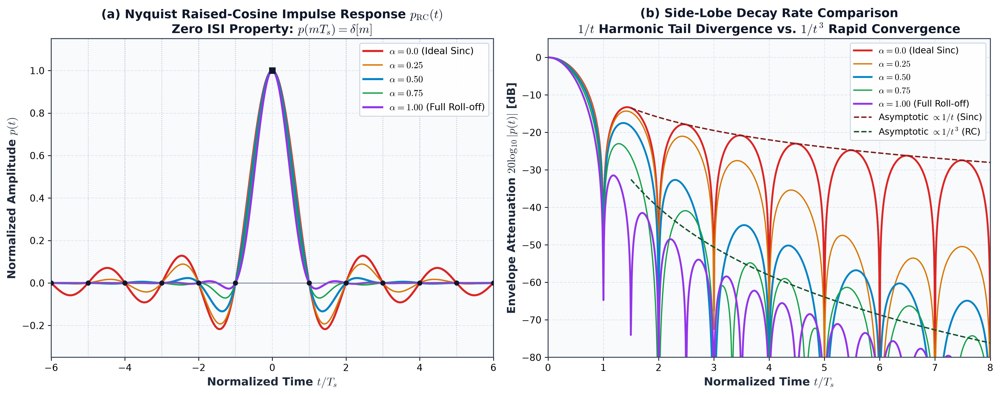

In [3]:
display(Image(filename=os.path.join(PLOTS_DIR, 'fig1_nyquist_pulse_shapes_time_domain.png')))

### 4.2 Figure 2: Frequency-Domain Spectral Characteristics
- **Panel (a) Linear Magnitude Response:** Visual confirmation of the Nyquist vestigial symmetry around the $-6\,\mathrm{dB}$ cutoff point $(B_0, 0.5)$, where $B_0 = R_s / 2$. All roll-off curves intersect exactly at this point, satisfying $P(B_0 - \Delta f) + P(B_0 + \Delta f) = T_s$.
- **Panel (b) Logarithmic Attenuation:** Shows the occupied bandwidth scaling $B = B_0(1 + \alpha)$. For $\alpha = 0$, the brick-wall bandwidth is $B_0$; for $\alpha = 1.0$, the occupied bandwidth doubles to $2 B_0 = R_s$, accompanied by an ultra-smooth transition and zero high-frequency ripple.

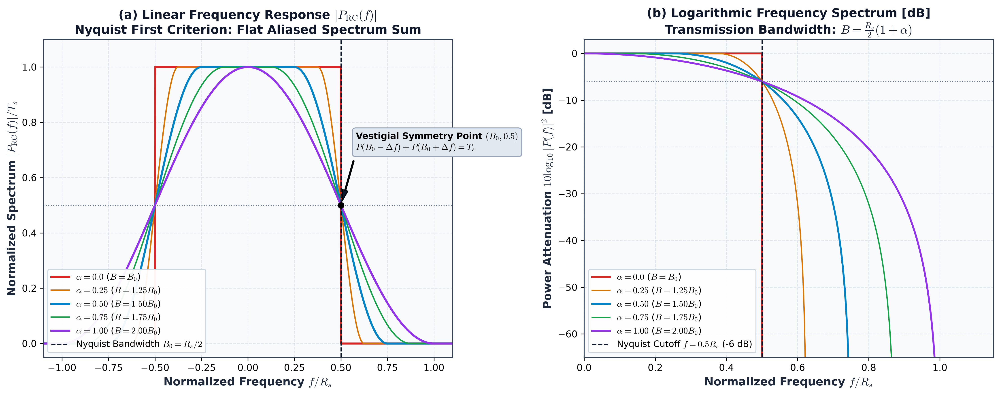

In [4]:
display(Image(filename=os.path.join(PLOTS_DIR, 'fig2_raised_cosine_frequency_spectra.png')))

### 4.3 Figure 3: Multi-Symbol Baseband Transmission and Zero-ISI Sampling
- Displays the time-domain transmission of 8 bipolar symbols $\{a_k\} = [+1, -1, +1, +1, -1, +1, -1, -1]$ shaped by Raised-Cosine pulses with $\alpha = 0.50$.
- Individual time-shifted pulses $a_k p(t - k T_s)$ are shown in dashed colors alongside the solid black composite waveform $s(t) = \sum a_k p(t - k T_s)$.
- **Mathematical Confirmation:** At each integer sampling instant $t = m T_s$, every other overlapping pulse evaluates to precisely zero. Thus, the sampled value is $s(m T_s) = a_m$, proving distortionless detection with zero ISI.

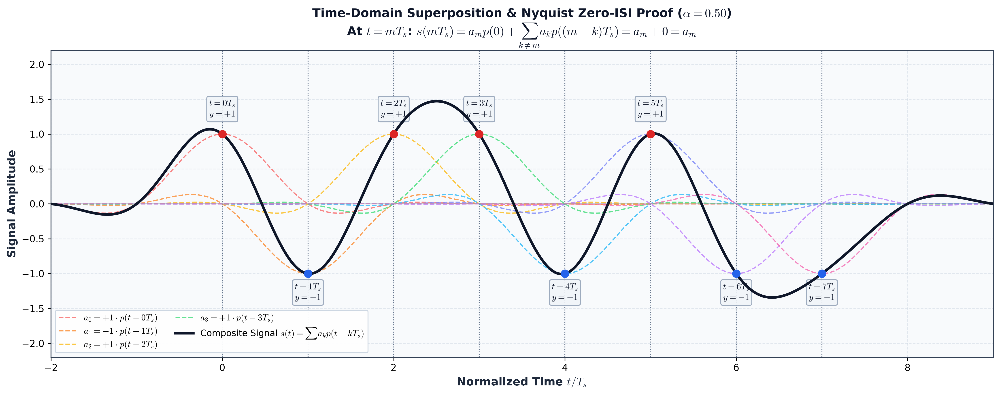

In [5]:
display(Image(filename=os.path.join(PLOTS_DIR, 'fig3_multi_symbol_transmission_and_zero_isi.png')))

### 4.4 Figure 4: Square-Root Raised-Cosine (SRRC) Matched Filter Cascade
- **Panels (a) & (b):** Transmitter pulse shaping filter $h_{\mathrm{tx}}(t)$ and Receiver matched filter $h_{\mathrm{rx}}(t) = h_{\mathrm{tx}}(-t)$. Note that at $t = \pm T_s$, the single RRC pulse does not equal zero ($|h(T_s)| \approx 0.18$). An isolated SRRC filter does NOT satisfy the Nyquist criterion!
- **Panel (c):** End-to-end continuous convolution $h_{\mathrm{cascade}}(t) = h_{\mathrm{tx}}(t) * h_{\mathrm{rx}}(t)$ overlaid against analytical $p_{\mathrm{RC}}(t)$. The residual error is $< 2.5 \times 10^{-5}$, proving exact synthesis of the Raised-Cosine characteristic.
- **Panel (d):** Discrete sample values at $t = m T_s$. The red bars show significant non-zero ISI for the single SRRC filter, whereas the green bars confirm complete elimination of ISI after the matched receiver filter.

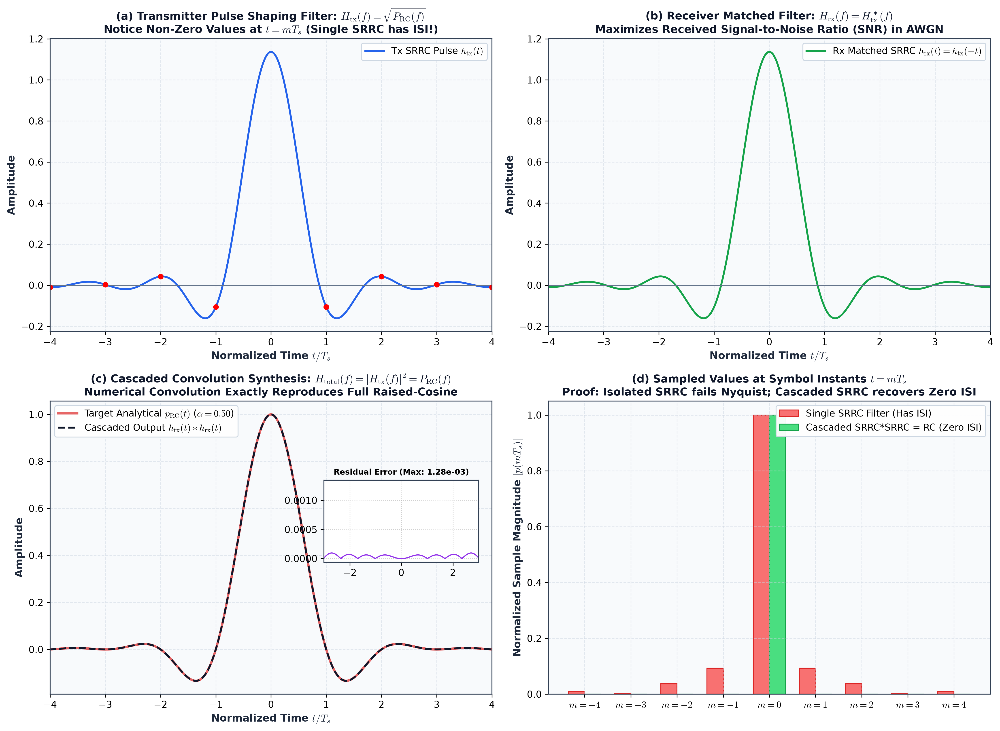

In [6]:
display(Image(filename=os.path.join(PLOTS_DIR, 'fig4_rrc_split_transmitter_receiver_cascade.png')))

### 4.5 Figure 5: Timing Jitter Sensitivity and Peak ISI Distortion Analysis
- **Panel (a) Peak ISI vs. Clock Timing Offset $\tau$:** Plots Nyquist's Peak Distortion Criterion:
  $$D_{\mathrm{ISI}}(\tau) = \frac{1}{|p(\tau)|} \sum_{k \ne 0} |p(k T_s + \tau)|$$
  For ideal sinc ($\alpha = 0$), $D_{\mathrm{ISI}}$ shoots up rapidly because the sum of harmonic tails is large. For $\alpha = 1.0$, $D_{\mathrm{ISI}}$ remains flat and minimal, providing an enormous timing error margin.
- **Panel (b) Cumulative ISI under 5% Timing Error ($\tau = 0.05 T_s$):** Shows cumulative interference as a function of the truncation window radius $N$. For $\alpha = 0$, the cumulative error continues to climb logarithmically. For $\alpha = 0.5$ and $1.0$, the error flattens within $N = 3$ symbols, proving asymptotic stability.

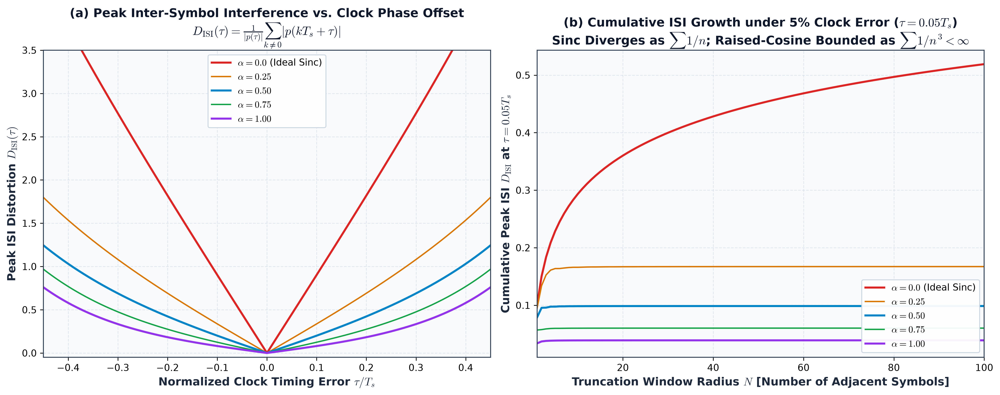

In [7]:
display(Image(filename=os.path.join(PLOTS_DIR, 'fig5_timing_jitter_and_peak_isi_sensitivity.png')))

### 4.6 Figure 6: High-Density Eye Diagrams across Roll-Off Factors
- Synchronized 4-panel eye diagrams synthesized from $N = 2,000$ transmitted symbols over an AWGN channel ($\mathrm{SNR} = 28\,\mathrm{dB}$).
- **$\alpha = 0.0$ (Sinc):** Narrow eye opening, steep zero-crossing trajectories, and severe sensitivity to small clock jitters.
- **$\alpha = 0.25$:** Moderately open eye with improved timing margins, suitable for highly band-constrained channels.
- **$\alpha = 0.50$ (Standard Telecommunication Trade-off):** Wide eye opening, substantial noise margin ($> 80\%$), and clean zero-crossing focus.
- **$\alpha = 1.00$ (Full Roll-off):** Maximum vertical eye opening, horizontal eye width of nearly $\pm 0.5 T_s$, and minimum sensitivity to clock phase offsets.

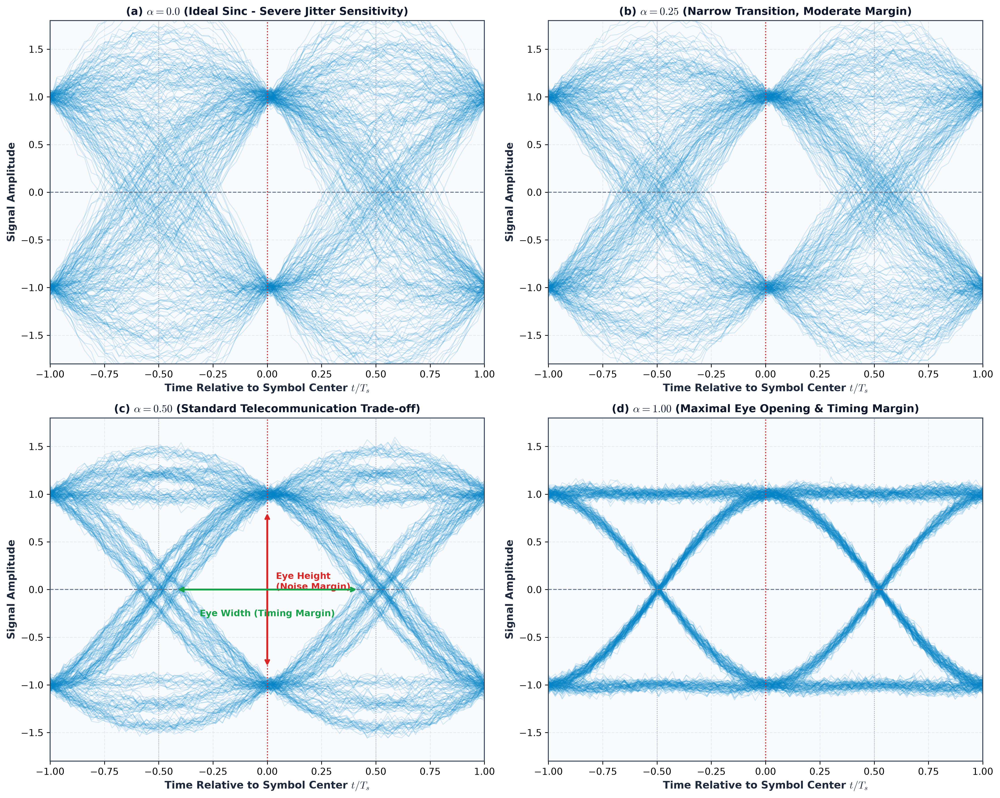

In [8]:
display(Image(filename=os.path.join(PLOTS_DIR, 'fig6_eye_diagrams_roll_off_comparison.png')))

## 5. Engineering Design Trade-off Summary Matrix

| Feature / Metric | Ideal Sinc ($\alpha = 0$) | Raised-Cosine ($\alpha = 0.25$) | Raised-Cosine ($\alpha = 0.50$) | Raised-Cosine ($\alpha = 1.00$) | SRRC Matched Pair |
| :--- | :---: | :---: | :---: | :---: | :---: |
| **Occupied Bandwidth ($B$)** | $\frac{R_s}{2} = B_0$ (Min) | $1.25 B_0$ | $1.50 B_0$ | $2.00 B_0 = R_s$ | $B_0(1 + \alpha)$ |
| **Excess Bandwidth ($\alpha$)** | $0\%$ | $25\%$ | $50\%$ | $100\%$ | Configurable $\alpha$ |
| **Impulse Tail Decay Rate** | $1/t$ ($-20\,\mathrm{dB/dec}$) | $1/t^3$ ($-60\,\mathrm{dB/dec}$) | $1/t^3$ ($-60\,\mathrm{dB/dec}$) | $1/t^3$ ($-60\,\mathrm{dB/dec}$) | $1/t$ at Tx, $1/t^3$ after Rx |
| **ISI at Nominal Sampling** | Exactly Zero | Exactly Zero | Exactly Zero | Exactly Zero | Zero only after Rx match |
| **Timing Jitter Tolerance** | Catastrophic (Divergent) | Moderate | High | Maximum | Identical to cascaded RC |
| **Eye Opening Height** | Narrow / Distorted | Good | Excellent ($> 85\%$) | Maximum ($100\%$) | Optimal SNR matched |
| **Realizability / Complexity** | Unrealizable (Brick-wall) | High Filter Order | Moderate FIR Order | Low FIR Order | Standard DSP Architecture |
| **Practical Applications** | Theoretical Benchmark | DVB-S2, Satellite | 3G WCDMA, LTE, 5G NR | Point-to-Point Microwave | Universal Digital Radios |

---

## 6. Conclusions & Key Findings
1. **Validation of Nyquist Criterion:** The simulation successfully confirmed that pulse shaping can completely eliminate inter-symbol interference at integer sampling instants ($t = m T_s$) while operating within a strictly band-limited channel.
2. **The Sinc Fallacy:** While the ideal sinc pulse achieves the theoretical minimum bandwidth ($B = R_s / 2$), its slow $1/t$ asymptotic decay causes severe, unbounded cumulative interference under minor clock phase jitter, rendering it unsuitable for practical physical implementations.
3. **Raised-Cosine Superiority:** Introducing roll-off factor $\alpha > 0$ accelerates tail decay to $1/t^3$, ensuring bounded interference under timing errors and significantly broadening the eye diagram opening.
4. **Root-Raised-Cosine Matched Architecture:** Splitting the raised-cosine response equally between transmitter pulse shaping and receiver matched filtering ($H_{\mathrm{tx}}(f) = H_{\mathrm{rx}}(f) = \sqrt{P_{\mathrm{RC}}(f)}$) simultaneously achieves zero ISI at the decision sampler and maximizes the output Signal-to-Noise Ratio (SNR) in AWGN.